# Machine Learning in Synthetic Biology – Submission of Final Project

Author: Lilou Gras 

Date: 04/06/2023

email: lilou.gras@gmail.com

University of Tartu

## Abstract

Plant diseases can have detrimental effects on crop yield and quality, leading to significant economic losses. Moreover, the misdiagnosis of diseases can result in the usage of the wrong and potentially dangerous pesticide. Using machine learning techniques, specifically deep learning algorithms, can help farmers to diagnose their plant with a simple picture. In this study, pictures of healthy and infected apple tree leafs were provided with their corresponding label. With the help of DenseNet121, a popular convolutional neural network architecture, alongside additionnal techniques I attempted to classify the different diseases of the apple tree. Experimental results demonstrated that the proposed approach achieved excellent classification accuracy, and showed the potential of deep learning in disease identification. However, this work could still use some improvements, it is more reliable than the traditional method of farmers trying to diagnose the pest by themselves. Future work may involve augmenting the dataset, exploring other deep learning architectures (ResNet, Yolo, EfficientNet...), and deploying the model in real-world scenarios to further validate its effectiveness and scalability.

## Introduction

blabla
https://www.fao.org/news/story/en/item/1402920/icode/
https://gpnmag.com/article/disease-discussions-problems-misdiagnosis/

## Dataset

How to get it and where ? Make a step by step :D 
Describe it 
Discuss the different labels, what is scab ? What is rust ? What is multiple diseases and discuss that you are not sure about it being 1 and the others 0
Show the pictures
Talk about balance, show the graph and talk about it 

## Methodology

I tried to make my own model and using dataloader but failed
I tried with images of size 512 by 512 but it actually took way too much space and time to run, even with 128,128 the model could take hours
In the end, I was able to find a lot of documentation online on DenseNet121 which is often used for these cases. I decided to use it and adapt it to this project. We have inputs of size 128,128 and want 4 different classes.


In [319]:
import cv2
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
import tensorflow as tf

img_path = "images/"
train_path = "train.csv"
test_path = "test.csv"
sample_submission_path = "sample_submission.csv"

train_pd = pd.read_csv(train_path)
test_pd = pd.read_csv(test_path)
ss_pd = pd.read_csv(sample_submission_path)

def load_image(image_id):
    file_path = img_path + image_id + ".jpg"
    image = cv2.imread(file_path)
    image = cv2.resize(image, (512, 512))
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Get the image IDs from the train_pd DataFrame
train_image_ids = train_pd["image_id"][:]

# Load the images using the image IDs
train_images = train_image_ids.progress_apply(load_image)

# Define the labels (y_train)
labels = train_pd.loc[:, 'healthy':].values
y_train = torch.tensor(labels, dtype=torch.float32)  # Convert labels to tensors

class CustomDataset(Dataset):
    def __init__(self, images, labels):
        self.images = images
        self.labels = labels

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]
        return image, label

# Debug the load_image function
for image_id in train_image_ids[:5]:
    image = load_image(image_id)
    print(image.shape)

# Check the length of the datasets
print(len(train_images))
print(len(y_train))

# Create train and validation datasets
train_dataset = CustomDataset(train_images, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

100%|██████████| 1821/1821 [00:43<00:00, 41.74it/s]


(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
(512, 512, 3)
1821
1821


In [320]:
# Little visualization
print(f'train.csv as pandas: \n {train_pd.head()}')
print(f'test.csv as pandas: \n {test_pd.head()}')
print(f'sample submission as pandas: \n {ss_pd.head()}')

train.csv as pandas: 
   image_id  healthy  multiple_diseases  rust  scab
0  Train_0        0                  0     0     1
1  Train_1        0                  1     0     0
2  Train_2        1                  0     0     0
3  Train_3        0                  0     1     0
4  Train_4        1                  0     0     0
test.csv as pandas: 
   image_id
0   Test_0
1   Test_1
2   Test_2
3   Test_3
4   Test_4
sample submission as pandas: 
   image_id  healthy  multiple_diseases  rust  scab
0   Test_0     0.25               0.25  0.25  0.25
1   Test_1     0.25               0.25  0.25  0.25
2   Test_2     0.25               0.25  0.25  0.25
3   Test_3     0.25               0.25  0.25  0.25
4   Test_4     0.25               0.25  0.25  0.25


In [321]:
fig = px.imshow(train_images[0]) # This leaf is diagnosed with scab
fig.show() 

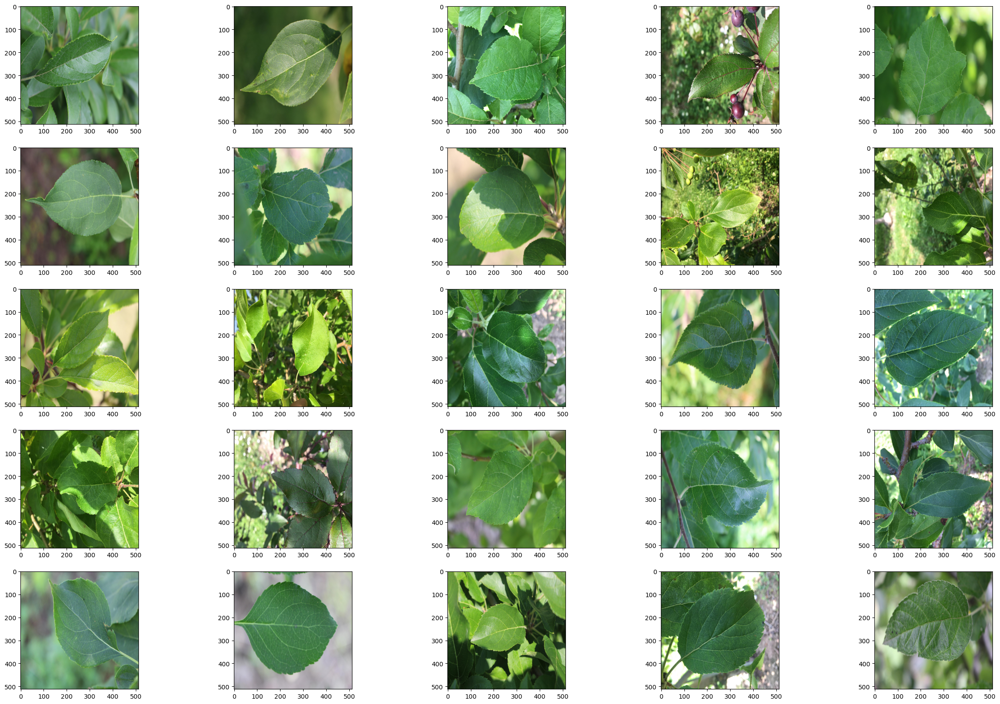

In [322]:
#Visualizing healthy leafs


data = train_pd.loc[100:300]
data = data.query("healthy == {}".format(1)) # https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.query.html and https://www.w3schools.com/python/ref_string_format.asp
images = train_images.loc[list(data.index)]
cols, rows = 5, min([5, len(images)//5])
    
fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(30, rows*20/5))
for col in range(cols):
    for row in range(rows):
        ax[row, col].imshow(images.loc[images.index[row*5+col]])
plt.show()

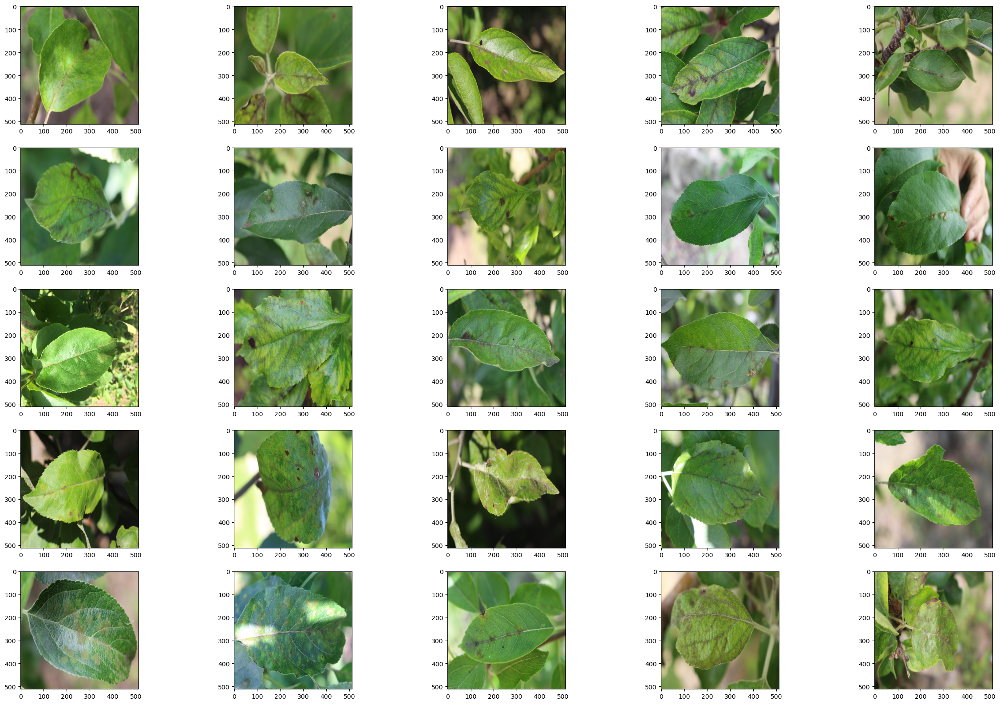

In [323]:
# Visualizing leafs with scab

data = train_pd.loc[100:300]
data = data.query("scab == {}".format(1)) # https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.query.html and https://www.w3schools.com/python/ref_string_format.asp
images = train_images.loc[list(data.index)]
cols, rows = 5, min([5, len(images)//5])
    
fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(30, rows*20/5))
for col in range(cols):
    for row in range(rows):
        ax[row, col].imshow(images.loc[images.index[row*5+col]])
plt.show()

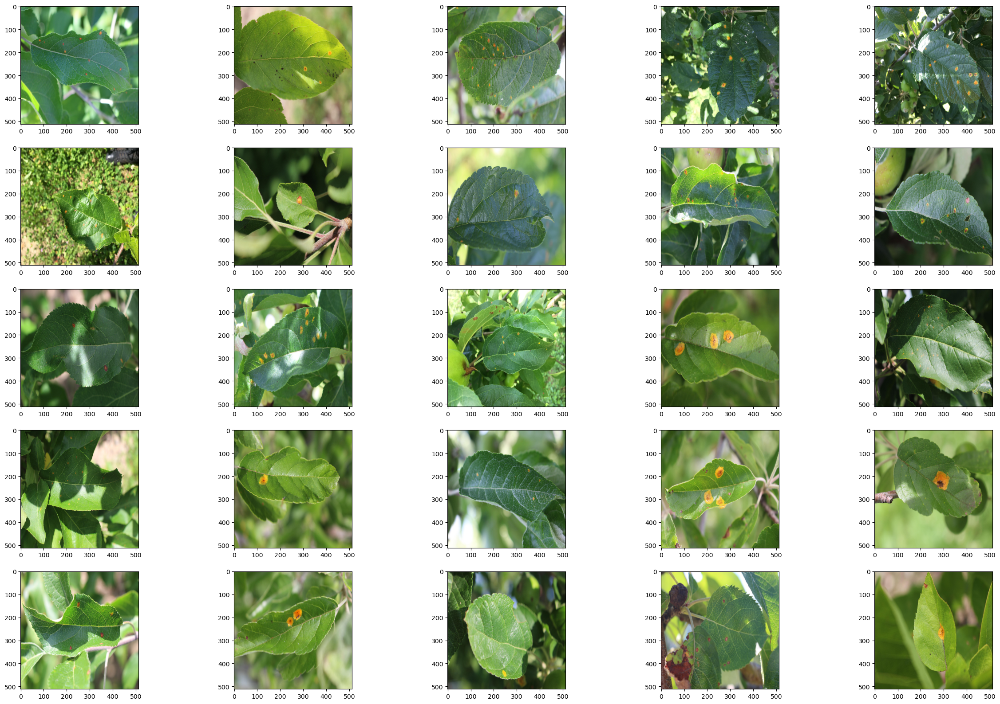

In [324]:
#Visualizing leafs with rust

data = train_pd.loc[100:300]
data = data.query("rust == {}".format(1)) # https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.query.html and https://www.w3schools.com/python/ref_string_format.asp
images = train_images.loc[list(data.index)]
cols, rows = 5, min([5, len(images)//5])
    
fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(30, rows*20/5))
for col in range(cols):
    for row in range(rows):
        ax[row, col].imshow(images.loc[images.index[row*5+col]])
plt.show()

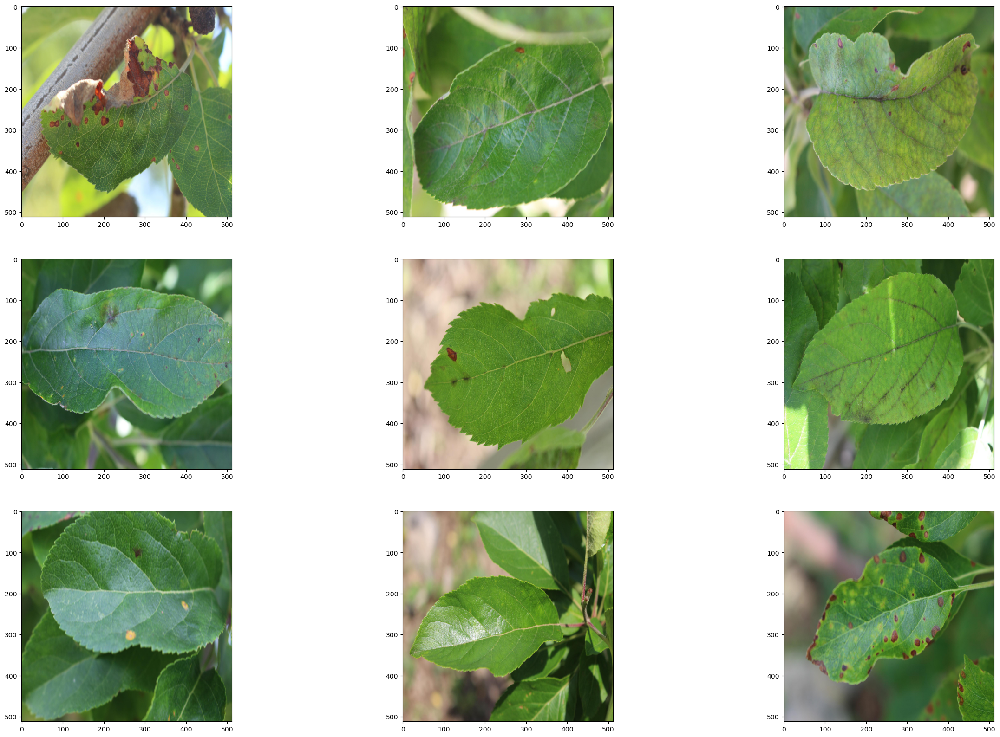

In [325]:
#Visualizing leafs with multiple diseases


data = train_pd.loc[:]
data = data.query("multiple_diseases == {}".format(1)) # https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.query.html and https://www.w3schools.com/python/ref_string_format.asp
images = train_images.loc[list(data.index)]
cols, rows = 3, min([3, len(images)//3])
    
fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(30, rows*20/3))
for col in range(cols):
    for row in range(rows):
        ax[row, col].imshow(images.loc[images.index[row*3+col]])
plt.show()

In [326]:
# To see if the dataset is balanced
train_pd_copy = train_pd.copy()
train_pd_copy["Healthy"] = train_pd_copy["healthy"].apply(bool).apply(str)
fig = px.histogram(train_pd_copy, x="Healthy", title="Healthy distribution", color="Healthy",\
            color_discrete_map={
                "True": px.colors.qualitative.Plotly[0],
                "False": px.colors.qualitative.Plotly[1]})
fig


In [327]:
#https://plotly.com/python-api-reference/generated/plotly.graph_objects.Figure.html
# To see if the dataset is balanced
fig = go.Figure([go.Pie(labels=train_pd.columns[1:], 
           values=train_pd.iloc[:, 1:].sum().values)])
fig

In [2]:
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.metrics import Precision, Recall
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
import xgboost as xgb
import seaborn as sns
import cv2
import pathlib
import os

c:\Users\lilou\Desktop\Anaconda\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [3]:


train_csv = pd.read_csv("train.csv")
images_path = pathlib.Path("images/")
list_images = list(images_path.glob("*.*"))
print(len(list_images))

images_id = train_csv['image_id']
healthy = train_csv['healthy']
multiple_diseases = train_csv['multiple_diseases']
rust = train_csv['rust']
scab = train_csv['scab']


3642


In [4]:
images = []
labels = []
for index, values in enumerate(images_id):
    img = cv2.imread(os.path.join( "images/", "{}.jpg".format(values)))
    img = cv2.resize(img, (128, 128))
    img = img/255
    labels.append([healthy[index], multiple_diseases[index], rust[index],
                 scab[index]])
    images.append(img)

In [5]:
img_generator = tf.keras.preprocessing.image.ImageDataGenerator(
        rotation_range=0.15,
        vertical_flip=True,
)

In [6]:
images_augmented = []
labels_augmented = []
for index, image in enumerate(images):
  for i in range(3):
      img = img_generator.flow(np.reshape(image, (1, 128, 128, 3))).next()
      images_augmented.append(np.reshape(img, (128, 128, 3)))
      labels_augmented.append(labels[index])
labels = np.asarray(labels_augmented)
images = np.asarray(images_augmented)

In [7]:
images.shape

(5463, 128, 128, 3)

In [8]:
d = tf.keras.applications.DenseNet121(include_top=False,
                   input_shape=(128,128,3),
                   pooling=None,
                   weights='imagenet')
for i in d.layers:
  i.trainable = True

In [14]:
output_avg = tf.keras.layers.GlobalAveragePooling2D()(d.output)
output_max = tf.keras.layers.GlobalMaxPooling2D()(d.output)
x = tf.keras.layers.minimum([output_avg, output_max])
x = tf.keras.layers.Dropout(0.5)(x)
x = tf.keras.layers.Dense(4, activation = "softmax")(x)
x = tf.keras.models.Model(inputs = d.input, outputs = x)

In [15]:
x.compile(optimizer = tf.keras.optimizers.Adam(0.001), 
          loss = "categorical_crossentropy", 
          metrics ="accuracy")
x.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 134, 134, 3)          0         ['input_1[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 64, 64, 64)           9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 64, 64, 64)           256       ['conv1/conv[0][0]']    

In [11]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size = 0.15, random_state = 42)
print(x_train.shape, x_test.shape)

(4643, 128, 128, 3) (820, 128, 128, 3)


In [16]:
history = x.fit(x_train, y_train, epochs = 30, batch_size = 32,
                callbacks = [
                    tf.keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=0.1, mode = 'min',
                                                  patience= 1),
                    tf.keras.callbacks.EarlyStopping(monitor = 'loss', patience = 3, mode = 'min', restore_best_weights = True)
                ])

Epoch 1/30
146/146 [==============================] - 346s 2s/step - loss: 0.7041 - accuracy: 0.7861 - lr: 0.0010
Epoch 2/30
146/146 [==============================] - 327s 2s/step - loss: 0.3033 - accuracy: 0.9011 - lr: 0.0010
Epoch 3/30
146/146 [==============================] - 330s 2s/step - loss: 0.3271 - accuracy: 0.8988 - lr: 0.0010
Epoch 4/30
146/146 [==============================] - 324s 2s/step - loss: 0.1824 - accuracy: 0.9395 - lr: 1.0000e-04
Epoch 5/30
146/146 [==============================] - 325s 2s/step - loss: 0.0690 - accuracy: 0.9776 - lr: 1.0000e-04
Epoch 6/30
146/146 [==============================] - 327s 2s/step - loss: 0.0523 - accuracy: 0.9836 - lr: 1.0000e-04
Epoch 7/30
146/146 [==============================] - 325s 2s/step - loss: 0.0276 - accuracy: 0.9916 - lr: 1.0000e-04
Epoch 8/30
146/146 [==============================] - 334s 2s/step - loss: 0.0265 - accuracy: 0.9925 - lr: 1.0000e-04
Epoch 9/30
146/146 [==============================] - 337s 2s/step -

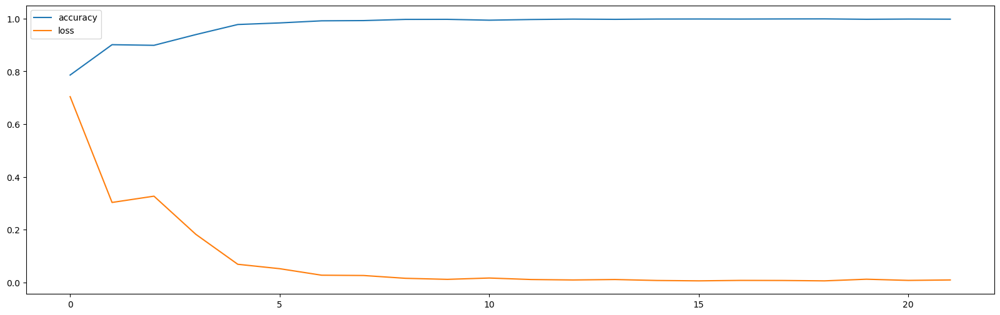

In [17]:
plt.figure(figsize = (20, 6))
plt.plot(history.history['accuracy'], label = "accuracy")
plt.plot(history.history['loss'], label = "loss")
plt.legend()

In [18]:
x.evaluate(x_test, y_test, batch_size= 32)

26/26 [==============================] - 14s 487ms/step - loss: 0.0990 - accuracy: 0.9817


[0.09895799309015274, 0.9817073345184326]

In [19]:
y_pred = x.predict(x_test)
y_pred = np.argmax(y_pred, axis = 1)
y_test = np.argmax(y_test, axis = 1)
cnn_standard_acc = accuracy_score(y_pred, y_test)
print(cnn_standard_acc)


26/26 [==============================] - 13s 465ms/step
0.9817073170731707


In [20]:
print(classification_report(y_pred, y_test))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98       230
           1       0.83      1.00      0.91        29
           2       0.99      0.99      0.99       285
           3       0.99      0.99      0.99       276

    accuracy                           0.98       820
   macro avg       0.95      0.99      0.96       820
weighted avg       0.98      0.98      0.98       820



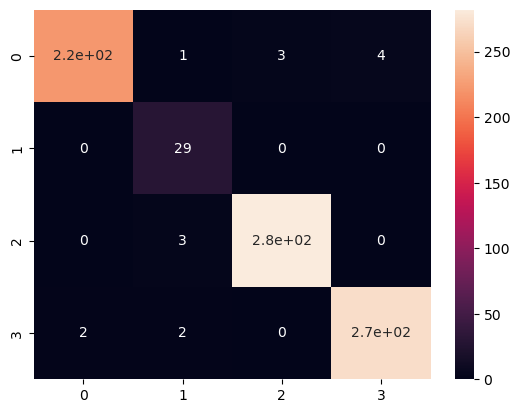

In [21]:
def generate_confusion_matrix(y_pred, y_test):
    c = tf.math.confusion_matrix(y_pred, y_test)
    sns.heatmap(c, annot=True)

generate_confusion_matrix(y_pred, y_test)

In [23]:
test_csv = pd.read_csv("test.csv")

images_id = test_csv['image_id']
images = []

for index, values in enumerate(images_id):
    img = cv2.imread(os.path.join( "images/", "{}.jpg".format(values)))
    img = cv2.resize(img, (128, 128))
    img = img/255
    images.append(img)
    
images = np.asarray(images)

In [24]:
y_pred = x.predict(images)
y_sub = pd.DataFrame(y_pred)
print(y_sub[:5])

57/57 [==============================] - 26s 459ms/step
          0             1             2             3
0  0.000034  5.338450e-05  9.997899e-01  1.227027e-04
1  0.000011  3.155178e-05  9.998041e-01  1.530705e-04
2  0.000024  2.188101e-06  1.496478e-05  9.999590e-01
3  1.000000  7.540179e-08  2.504681e-07  1.622930e-08
4  0.000002  1.348977e-05  9.999828e-01  1.904572e-06


In [25]:
submission = pd.concat([images_id, y_sub], axis=1)
submission.columns = ["image_id", "healthy", "multiple_diseases", "rust", "scab"]
print(submission.head())

  image_id   healthy  multiple_diseases          rust          scab
0   Test_0  0.000034       5.338450e-05  9.997899e-01  1.227027e-04
1   Test_1  0.000011       3.155178e-05  9.998041e-01  1.530705e-04
2   Test_2  0.000024       2.188101e-06  1.496478e-05  9.999590e-01
3   Test_3  1.000000       7.540179e-08  2.504681e-07  1.622930e-08
4   Test_4  0.000002       1.348977e-05  9.999828e-01  1.904572e-06


In [26]:
submission_csv = submission.to_csv('sample_submission.csv', index=False)

## Other attempts 

<div class="alert alert-info" style="color:yellow">
The following codes are currently not working ! I was not able to use dataloader as I first wanted and make my own model from scratch
</div>

In [ ]:
import pandas as pd
import numpy as np
import cv2
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from sklearn.model_selection import train_test_split

# Load the training data
train_df = pd.read_csv("train.csv")
img_path = "images/"


# Split the data into train and validation sets
train_indices, val_indices = train_test_split(train_df.index, test_size=0.2, random_state=42)

train_images = train_df.loc[train_indices, "image_id"]
train_labels = train_df.loc[train_indices, "healthy":].values

val_images = train_df.loc[val_indices, "image_id"]
val_labels = train_df.loc[val_indices, "healthy":].values

# Reset the indices of train_images and train_labels
train_images = train_images.reset_index(drop=True)
train_labels = pd.DataFrame(train_labels, index=train_images.index)

class PlantPathologyDataset(Dataset):
    def __init__(self, image_ids, labels, img_dir, transform=None):
        self.image_ids = image_ids
        self.labels = labels
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        file_path = self.img_dir + image_id + ".jpg"
        labels = self.labels[idx]
        image = cv2.imread(file_path)
        image = cv2.resize(image, (512, 512))
        #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        if self.transform:
            image = self.transform(image)

        return image, labels

        #For data augmentation, I'll see later
transform = transforms.Compose([
    transforms.ToTensor(),
])

# Create the training dataset
train_dataset = PlantPathologyDataset(train_images, train_labels, img_path, transform=transform)

# Create the validation dataset
val_dataset = PlantPathologyDataset(val_images, val_labels, img_path, transform=transform)

# Create the data loaders
batch_size = 8
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# i = 0
# for images, labels in train_loader:
#     try:
#         print(i)
#         i += 1
#     except Exception as e:
#         print(f"Error occurred at index {i}: {e}")

class MyModel(nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=(8, 8), stride=(2, 2))
        self.act1 = nn.ReLU()
        self.flatten = nn.Flatten(start_dim=1, end_dim=-1)

        conv_output_size = ((512 - 8) // 2 + 1) ** 2 * 32
        self.fc = nn.Linear(conv_output_size, 4)

    def forward(self, x):
        x = self.conv1(x)
        x = self.act1(x)
        x = self.flatten(x)
        x = self.fc(x)
        return x

num_epochs = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = MyModel().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

for epoch in range(num_epochs):
    model.train()  # Set the model to training mode
    running_loss = 0.0

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, torch.argmax(labels, dim=1))
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    epoch_loss = running_loss / len(train_loader)
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}")

    model.eval()  # Set the model to evaluation mode
total_correct = 0
total_samples = 0

with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        _, predicted = torch.max(outputs, dim=1)

        total_samples += labels.size(0)
        total_correct += (predicted == torch.argmax(labels, dim=1)).sum().item()

accuracy = total_correct / total_samples
print(f"Validation Accuracy: {accuracy * 100:.2f}%")

test_df = pd.read_csv("test.csv")
test_dataset = PlantPathologyDataset(test_df, img_path, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

model.eval()  # Set the model to evaluation mode
test_predictions = []

with torch.no_grad():
    for images, _ in test_loader:
        images = images.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, dim=1)
        test_predictions.extend(predicted.cpu().numpy())

test_df["predicted_label"] = test_predictions
test_df.to_csv("test_predictions.csv", index=False)

In [ ]:
import cv2
import pandas as pd
import torch
from torch.utils.data import Dataset, DataLoader
import tensorflow as tf

img_path = "images/"
train_path = "train.csv"
test_path = "test.csv"
sample_submission_path = "sample_submission.csv"

train_pd = pd.read_csv(train_path)
test_pd = pd.read_csv(test_path)
ss_pd = pd.read_csv(sample_submission_path)

def load_image(image_id):
    file_path = img_path + image_id + ".jpg"
    image = cv2.imread(file_path)
    image = cv2.resize(image, (512, 512))
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Get the image IDs from the train_pd DataFrame
train_image_ids = train_pd["image_id"][:]

# Load the images using the image IDs
train_images = train_image_ids.progress_apply(load_image)

# Define the labels (y_train)
labels = train_pd.loc[:, 'healthy':].values
y = torch.tensor(labels, dtype=torch.float32)  # Convert labels to tensors

class CustomDataset(Dataset):
    def __init__(self, images, labels):
        self.images = images
        self.labels = labels

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]
        return image, label

# Debug the load_image function
for image_id in train_image_ids[:5]:
    image = load_image(image_id)
    if image.shape!=(512, 512, 3):
        print(image_id)

# Check the length of the datasets
print(len(train_images))
print(len(y))

# Create train and validation datasets
X_train, X_val, y_train, y_val = train_test_split(train_images, y, test_size=0.15)

train_dataset = CustomDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_dataset = CustomDataset(X_val, y_val)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
